In [1]:
!pip install patchify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import os
import cv2
import numpy as np
import skimage.io
from matplotlib import pyplot as plt
from patchify import patchify, unpatchify
from PIL import Image
from glob import glob
from tqdm import tqdm
import imageio
from albumentations import HorizontalFlip, VerticalFlip, Rotate
import tensorflow as tf 
from tensorflow.keras import models, layers, regularizers
from tensorflow.keras import backend as K
from sklearn.metrics import jaccard_score,confusion_matrix
from tensorflow.keras.optimizers import Adam

np.random.seed(0)

In [3]:
#CLAHE
def clahe_equalized(imgs):    
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))    
    imgs_equalized = clahe.apply(imgs)
    return imgs_equalized

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
def load_data(path):
    train_x = sorted(glob(os.path.join(path, "images", "*.jpg")))
    train_y = sorted(glob(os.path.join(path, "masks", "*.jpg")))


    return (train_x, train_y)

In [6]:
if __name__ == "__main__":
    """ Seeding """
    np.random.seed(42)

    """ Load the data """
    data_path = '/content/drive/MyDrive/Datasets/DRIVE/training/'
    (train_x, train_y) = load_data(data_path)

In [7]:
print(f"Train: {len(train_x)} - {len(train_y)}")

Train: 20 - 20


In [8]:
def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

In [9]:
""" Create directories to save the augmented data """
create_dir("/content/drive/MyDrive/Datasets/DRIVE/training/aug_images")
create_dir("/content/drive/MyDrive/Datasets/DRIVE/training/aug_masks")

# **Data Augmentation**

In [10]:
def augment_data(images, masks, save_path, augment=True):
    size = (512, 512)
    for idx, (x, y) in tqdm(enumerate(zip(images, masks)), total=len(images)):
        """ Extracting the name """
        name = x.split("/")[-1].split(".")[0]

        """ Reading image and mask """
        x = cv2.imread(x, cv2.IMREAD_COLOR)
        y = imageio.mimread(y)[0]

        if augment == True:
            aug = HorizontalFlip(p=1.0)
            augmented = aug(image=x, mask=y)
            x1 = augmented["image"]
            y1 = augmented["mask"]

            aug = VerticalFlip(p=1.0)
            augmented = aug(image=x, mask=y)
            x2 = augmented["image"]
            y2 = augmented["mask"]

            aug = Rotate(limit=45, p=1.0)
            augmented = aug(image=x, mask=y)
            x3 = augmented["image"]
            y3 = augmented["mask"]

            X = [x, x1, x2, x3]
            Y = [y, y1, y2, y3]

        else:
            X = [x]
            Y = [y]

        index = 0
        for i, m in zip(X, Y):
            i = cv2.resize(i, size)
            m = cv2.resize(m, size)

            tmp_image_name = f"{name}_{index}.jpg"
            tmp_mask_name = f"{name}_{index}.jpg"

            image_path = os.path.join(save_path, "aug_images", tmp_image_name)
            mask_path = os.path.join(save_path, "aug_masks", tmp_mask_name)

            cv2.imwrite(image_path, i)
            cv2.imwrite(mask_path, m)

            index += 1

In [11]:
augment_data(train_x, train_y, "/content/drive/MyDrive/Datasets/DRIVE/training/", augment=True)

100%|██████████| 20/20 [00:10<00:00,  1.96it/s]


# **Creating Dataloader**

In [12]:
path1 = '/content/drive/MyDrive/Datasets/DRIVE/training/aug_images' 
path2 = '/content/drive/MyDrive/Datasets/DRIVE/training/aug_masks'

In [13]:
image_dataset = []
mask_dataset = [] 

patch_size = 512

In [14]:
images = sorted(os.listdir(path1)) 
for i, image_name in enumerate(images):  
    if image_name.endswith(".jpg"):                   
        image = skimage.io.imread(path1+"/"+image_name)  #Read image
        image = image[:,:,1] #selecting green channel
        image = clahe_equalized(image) #applying CLAHE
        SIZE_X = (image.shape[1]//patch_size)*patch_size #getting size multiple of patch size
        SIZE_Y = (image.shape[0]//patch_size)*patch_size #getting size multiple of patch size
        image = Image.fromarray(image)        
        image = image.resize((SIZE_X, SIZE_Y)) #resize image       
        image = np.array(image) 
        patches_img = patchify(image, (patch_size, patch_size), step=patch_size)  #create patches(patch_sizexpatch_sizex1)

        for i in range(patches_img.shape[0]):
            for j in range(patches_img.shape[1]):                        
                single_patch_img = patches_img[i,j,:,:]                 
                single_patch_img = (single_patch_img.astype('float32')) / 255.                    
                image_dataset.append(single_patch_img)

In [15]:
masks = sorted(os.listdir(path2))  
for i, mask_name in enumerate(masks):  
    if mask_name.endswith(".jpg"):                  
        mask = skimage.io.imread(path2+"/"+mask_name)   #Read masks
        SIZE_X = (mask.shape[1]//patch_size)*patch_size #getting size multiple of patch size
        SIZE_Y = (mask.shape[0]//patch_size)*patch_size #getting size multiple of patch size
        mask = Image.fromarray(mask)        
        mask = mask.resize((SIZE_X, SIZE_Y))  #resize image
        mask = np.array(mask)
        patches_mask = patchify(mask, (patch_size, patch_size), step=patch_size)  #create patches(patch_sizexpatch_sizex1)
            
        for i in range(patches_mask.shape[0]):
            for j in range(patches_mask.shape[1]):                            
                single_patch_mask = patches_mask[i,j,:,:]
                single_patch_mask = (single_patch_mask.astype('float32'))/255. 
                mask_dataset.append(single_patch_mask) 

In [16]:
image_dataset = np.array(image_dataset)
mask_dataset =  np.array(mask_dataset)
image_dataset = np.expand_dims(image_dataset,axis=-1)
mask_dataset =  np.expand_dims(mask_dataset,axis=-1)

In [17]:
image_dataset.shape

(80, 512, 512, 1)

In [18]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(image_dataset, mask_dataset, test_size=0.2, random_state=0)

**Blocks**

In [19]:
#convolutional block
def conv_block(x, kernelsize, filters, dropout, batchnorm=False): 
    conv = layers.Conv2D(filters, (kernelsize, kernelsize), kernel_initializer='he_normal', padding="same")(x)
    if batchnorm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation("relu")(conv)
    if dropout > 0:
        conv = layers.Dropout(dropout)(conv)
    conv = layers.Conv2D(filters, (kernelsize, kernelsize), kernel_initializer='he_normal', padding="same")(conv)
    if batchnorm is True:
        conv = layers.BatchNormalization(axis=3)(conv)
    conv = layers.Activation("relu")(conv)
    return conv


In [20]:
#residual convolutional block
def res_conv_block(x, kernelsize, filters, dropout, batchnorm=False):
    conv1 = layers.Conv2D(filters, (kernelsize, kernelsize), kernel_initializer='he_normal', padding='same')(x)
    if batchnorm is True:
        conv1 = layers.BatchNormalization(axis=3)(conv1)
    conv1 = layers.Activation('relu')(conv1)    
    conv2 = layers.Conv2D(filters, (kernelsize, kernelsize), kernel_initializer='he_normal', padding='same')(conv1)
    if batchnorm is True:
        conv2 = layers.BatchNormalization(axis=3)(conv2)
        conv2 = layers.Activation("relu")(conv2)
    if dropout > 0:
        conv2 = layers.Dropout(dropout)(conv2)
        
    #skip connection    
    shortcut = layers.Conv2D(filters, kernel_size=(1, 1), kernel_initializer='he_normal', padding='same')(x)
    if batchnorm is True:
        shortcut = layers.BatchNormalization(axis=3)(shortcut)
    shortcut = layers.Activation("relu")(shortcut)
    respath = layers.add([shortcut, conv2])       
    return respath

In [21]:
#gating signal for attention unit
def gatingsignal(input, out_size, batchnorm=False):
    x = layers.Conv2D(out_size, (1, 1), padding='same')(input)
    if batchnorm:
        x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    return x

In [22]:
#attention unit/block based on soft attention
def attention_block(x, gating, inter_shape):
    shape_x = K.int_shape(x)
    shape_g = K.int_shape(gating)
    theta_x = layers.Conv2D(inter_shape, (2, 2), strides=(2, 2), kernel_initializer='he_normal', padding='same')(x) 
    shape_theta_x = K.int_shape(theta_x)
    phi_g = layers.Conv2D(inter_shape, (1, 1), kernel_initializer='he_normal', padding='same')(gating)
    upsample_g = layers.Conv2DTranspose(inter_shape, (3, 3), strides=(shape_theta_x[1] // shape_g[1], shape_theta_x[2] // shape_g[2]), kernel_initializer='he_normal', padding='same')(phi_g)
    concat_xg = layers.add([upsample_g, theta_x])
    act_xg = layers.Activation('relu')(concat_xg)
    psi = layers.Conv2D(1, (1, 1), kernel_initializer='he_normal', padding='same')(act_xg)
    sigmoid_xg = layers.Activation('sigmoid')(psi)
    shape_sigmoid = K.int_shape(sigmoid_xg)
    upsample_psi = layers.UpSampling2D(size=(shape_x[1] // shape_sigmoid[1], shape_x[2] // shape_sigmoid[2]))(sigmoid_xg) 
    upsample_psi = layers.Lambda(lambda x, repnum: K.repeat_elements(x, repnum, axis=3), arguments={'repnum': shape_x[3]})(upsample_psi)                          
    y = layers.multiply([upsample_psi, x])
    result = layers.Conv2D(shape_x[3], (1, 1), kernel_initializer='he_normal', padding='same')(y)
    attenblock = layers.BatchNormalization()(result)
    return attenblock

**U-Net Architecture**

In [23]:
#U-NET
def unetmodel(input_shape, dropout=0.2, batchnorm=True):    
    
    filters = [16, 32, 64, 128, 256]
    kernelsize = 3
    upsample_size = 2
    
    inputs = layers.Input(input_shape)    

    # Downsampling layers
    dn_1 = conv_block(inputs, kernelsize, filters[0], dropout, batchnorm)
    pool_1 = layers.MaxPooling2D(pool_size=(2,2))(dn_1)
    
    dn_2 = conv_block(pool_1, kernelsize, filters[1], dropout, batchnorm)
    pool_2 = layers.MaxPooling2D(pool_size=(2,2))(dn_2)
    
    dn_3 = conv_block(pool_2, kernelsize, filters[2], dropout, batchnorm)
    pool_3 = layers.MaxPooling2D(pool_size=(2,2))(dn_3)
    
    dn_4 = conv_block(pool_3, kernelsize, filters[3], dropout, batchnorm)
    pool_4 = layers.MaxPooling2D(pool_size=(2,2))(dn_4)
    
    dn_5 = conv_block(pool_4, kernelsize, filters[4], dropout, batchnorm)

    # Upsampling layers   
    up_5 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(dn_5)
    up_5 = layers.concatenate([up_5, dn_4], axis=3)
    up_conv_5 = conv_block(up_5, kernelsize, filters[3], dropout, batchnorm)
    
    up_4 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv_5)
    up_4 = layers.concatenate([up_4, dn_3], axis=3)
    up_conv_4 = conv_block(up_4, kernelsize, filters[2], dropout, batchnorm)
       
    up_3 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv_4)
    up_3 = layers.concatenate([up_3, dn_2], axis=3)
    up_conv_3 = conv_block(up_3, kernelsize, filters[1], dropout, batchnorm)
    
    up_2 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv_3)
    up_2 = layers.concatenate([up_2, dn_1], axis=3)
    up_conv_2 = conv_block(up_2, kernelsize, filters[0], dropout, batchnorm)    
   
    conv_final = layers.Conv2D(1, kernel_size=(1,1))(up_conv_2)
    conv_final = layers.BatchNormalization(axis=3)(conv_final)
    outputs = layers.Activation('sigmoid')(conv_final)  

    model = models.Model(inputs=[inputs], outputs=[outputs])
    model.summary()        
    return model

**Residual U-Net Architecture**

In [24]:
#Res-UNET
def residualunet(input_shape, dropout=0.2, batchnorm=True):

    filters = [16, 32, 64, 128, 256]
    kernelsize = 3
    upsample_size = 2

    inputs = layers.Input(input_shape) 

    # Downsampling layers    
    dn_conv1 = conv_block(inputs, kernelsize, filters[0], dropout, batchnorm)
    dn_pool1 = layers.MaxPooling2D(pool_size=(2,2))(dn_conv1)

    dn_conv2 = res_conv_block(dn_pool1, kernelsize, filters[1], dropout, batchnorm)
    dn_pool2 = layers.MaxPooling2D(pool_size=(2,2))(dn_conv2)

    dn_conv3 = res_conv_block(dn_pool2, kernelsize, filters[2], dropout, batchnorm)
    dn_pool3 = layers.MaxPooling2D(pool_size=(2,2))(dn_conv3)

    dn_conv4 = res_conv_block(dn_pool3, kernelsize, filters[3], dropout, batchnorm)
    dn_pool4 = layers.MaxPooling2D(pool_size=(2,2))(dn_conv4)

    dn_conv5 = res_conv_block(dn_pool4, kernelsize, filters[4], dropout, batchnorm)
   
    # upsampling layers
    up_conv6 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(dn_conv5)
    up_conv6 = layers.concatenate([up_conv6, dn_conv4], axis=3)
    up_conv6 = res_conv_block(up_conv6, kernelsize, filters[3], dropout, batchnorm)

    up_conv7 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv6)
    up_conv7 = layers.concatenate([up_conv7, dn_conv3], axis=3)
    up_conv7 = res_conv_block(up_conv7, kernelsize, filters[2], dropout, batchnorm)

    up_conv8 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv7)
    up_conv8 = layers.concatenate([up_conv8, dn_conv2], axis=3)
    up_conv8 = res_conv_block(up_conv8, kernelsize, filters[1], dropout, batchnorm)

    up_conv9 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv8)
    up_conv9 = layers.concatenate([up_conv9, dn_conv1], axis=3)
    up_conv9 = res_conv_block(up_conv9, kernelsize, filters[0], dropout, batchnorm)


    conv_final = layers.Conv2D(1, kernel_size=(1,1))(up_conv9)
    conv_final = layers.BatchNormalization(axis=3)(conv_final)
    outputs = layers.Activation('sigmoid')(conv_final) 
    
    model = models.Model(inputs=[inputs], outputs=[outputs])
    model.summary()
    return model

**Attention U-Net Architecture**

In [25]:
#Attention U-NET
def attentionunet(input_shape, dropout=0.2, batchnorm=True):
    
    filters = [16, 32, 64, 128, 256]
    kernelsize = 3
    upsample_size = 2

    inputs = layers.Input(input_shape) 

    # Downsampling layers    
    dn_1 = conv_block(inputs, kernelsize, filters[0], dropout, batchnorm)
    pool_1 = layers.MaxPooling2D(pool_size=(2,2))(dn_1)
    
    dn_2 = conv_block(pool_1, kernelsize, filters[1], dropout, batchnorm)
    pool_2 = layers.MaxPooling2D(pool_size=(2,2))(dn_2)
    
    dn_3 = conv_block(pool_2, kernelsize, filters[2], dropout, batchnorm)
    pool_3 = layers.MaxPooling2D(pool_size=(2,2))(dn_3)
    
    dn_4 = conv_block(pool_3, kernelsize, filters[3], dropout, batchnorm)
    pool_4 = layers.MaxPooling2D(pool_size=(2,2))(dn_4)
    
    dn_5 = conv_block(pool_4, kernelsize, filters[4], dropout, batchnorm)

    # Upsampling layers    
    gating_5 = gatingsignal(dn_5, filters[3], batchnorm)
    att_5 = attention_block(dn_4, gating_5, filters[3])
    up_5 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(dn_5)
    up_5 = layers.concatenate([up_5, att_5], axis=3)
    up_conv_5 = conv_block(up_5, kernelsize, filters[3], dropout, batchnorm)
    
    gating_4 = gatingsignal(up_conv_5, filters[2], batchnorm)
    att_4 = attention_block(dn_3, gating_4, filters[2])
    up_4 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv_5)
    up_4 = layers.concatenate([up_4, att_4], axis=3)
    up_conv_4 = conv_block(up_4, kernelsize, filters[2], dropout, batchnorm)
   
    gating_3 = gatingsignal(up_conv_4, filters[1], batchnorm)
    att_3 = attention_block(dn_2, gating_3, filters[1])
    up_3 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv_4)
    up_3 = layers.concatenate([up_3, att_3], axis=3)
    up_conv_3 = conv_block(up_3, kernelsize, filters[1], dropout, batchnorm)
    
    gating_2 = gatingsignal(up_conv_3, filters[0], batchnorm)
    att_2 = attention_block(dn_1, gating_2, filters[0])
    up_2 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv_3)
    up_2 = layers.concatenate([up_2, att_2], axis=3)
    up_conv_2 = conv_block(up_2, kernelsize, filters[0], dropout, batchnorm)
    
    conv_final = layers.Conv2D(1, kernel_size=(1,1))(up_conv_2)
    conv_final = layers.BatchNormalization(axis=3)(conv_final)
    outputs = layers.Activation('sigmoid')(conv_final)  

    model = models.Model(inputs=[inputs], outputs=[outputs])
    model.summary()       
    return model  

**Residual-Attention (RA) U-Net Architecture**

In [26]:
#Residual-Attention UNET (RA-UNET)
def residual_attentionunet(input_shape, dropout=0.2, batchnorm=True):
    
    filters = [16, 32, 64, 128, 256]
    kernelsize = 3
    upsample_size = 2
    
    inputs = layers.Input(input_shape)    
    
    # Downsampling layers
    dn_1 = res_conv_block(inputs, kernelsize, filters[0], dropout, batchnorm)
    pool1 = layers.MaxPooling2D(pool_size=(2,2))(dn_1)

    dn_2 = res_conv_block(pool1, kernelsize, filters[1], dropout, batchnorm)
    pool2 = layers.MaxPooling2D(pool_size=(2,2))(dn_2)

    dn_3 = res_conv_block(pool2, kernelsize, filters[2], dropout, batchnorm)
    pool3 = layers.MaxPooling2D(pool_size=(2,2))(dn_3)

    dn_4 = res_conv_block(pool3, kernelsize, filters[3], dropout, batchnorm)
    pool4 = layers.MaxPooling2D(pool_size=(2,2))(dn_4)

    dn_5 = res_conv_block(pool4, kernelsize, filters[4], dropout, batchnorm)

    # Upsampling layers    
    gating_5 = gatingsignal(dn_5, filters[3], batchnorm)
    att_5 = attention_block(dn_4, gating_5, filters[3])
    up_5 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(dn_5)
    up_5 = layers.concatenate([up_5, att_5], axis=3)
    up_conv_5 = res_conv_block(up_5, kernelsize, filters[3], dropout, batchnorm)
    
    gating_4 = gatingsignal(up_conv_5, filters[2], batchnorm)
    att_4 = attention_block(dn_3, gating_4, filters[2])
    up_4 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv_5)
    up_4 = layers.concatenate([up_4, att_4], axis=3)
    up_conv_4 = res_conv_block(up_4, kernelsize, filters[2], dropout, batchnorm)
   
    gating_3 = gatingsignal(up_conv_4, filters[1], batchnorm)
    att_3 = attention_block(dn_2, gating_3, filters[1])
    up_3 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv_4)
    up_3 = layers.concatenate([up_3, att_3], axis=3)
    up_conv_3 = res_conv_block(up_3, kernelsize, filters[1], dropout, batchnorm)
    
    gating_2 = gatingsignal(up_conv_3, filters[0], batchnorm)
    att_2 = attention_block(dn_1, gating_2, filters[0])
    up_2 = layers.UpSampling2D(size=(upsample_size, upsample_size), data_format="channels_last")(up_conv_3)
    up_2 = layers.concatenate([up_2, att_2], axis=3)
    up_conv_2 = res_conv_block(up_2, kernelsize, filters[0], dropout, batchnorm)
   
    conv_final = layers.Conv2D(1, kernel_size=(1,1))(up_conv_2)
    conv_final = layers.BatchNormalization(axis=3)(conv_final)
    outputs = layers.Activation('sigmoid')(conv_final)  

    model = models.Model(inputs=[inputs], outputs=[outputs])
    model.summary() 
    return model

# **Metrics**

In [27]:
def IoU_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)

def IoU_loss(y_true, y_pred):
    return -IoU_coef(y_true, y_pred)
 
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2.0 * intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1.0)
 
def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)
  
def accuracy(y_true, y_pred):
    cm = confusion_matrix(y_true.flatten(),y_pred.flatten(), labels=[0, 1])
    acc = (cm[0,0]+cm[1,1])/(cm[0,0]+cm[0,1]+cm[1,0]+cm[1,1])
    return acc
  
def IoU(y_true, y_pred, labels = [0, 1]):
    IoU = []
    for label in labels:
        jaccard = jaccard_score(y_pred.flatten(),y_true.flatten(), pos_label=label, average='weighted')
        IoU.append(jaccard)     
    return np.mean(IoU) 

**Parameters**

In [28]:
IMG_HEIGHT = patch_size
IMG_WIDTH = patch_size
IMG_CHANNELS = 1
input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)

# **U-Net**

In [29]:
unet_model = unetmodel(input_shape)
unet_model.compile(optimizer = Adam(lr = 1e-3), loss= IoU_loss, metrics= ['accuracy', IoU_coef])


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 16  160         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


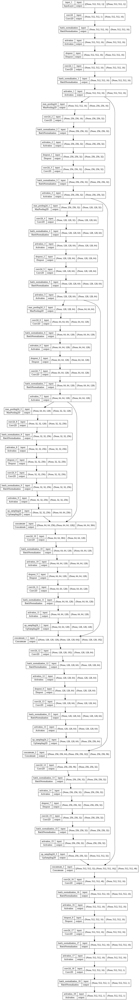

In [30]:
tf.keras.utils.plot_model(unet_model, to_file='/content/drive/MyDrive/Datasets/DRIVE/unet_model.png', show_shapes=True)

In [31]:
#train model
unet_history = unet_model.fit(x_train, y_train, 
                    verbose=1,
                    batch_size = 1,
                    validation_data=(x_test, y_test ), 
                    shuffle=False,
                    epochs=200)

Epoch 1/200
64/64 [==============================] - 20s 73ms/step - loss: -0.1461 - accuracy: 0.6041 - IoU_coef: 0.1461 - val_loss: -0.0885 - val_accuracy: 0.6251 - val_IoU_coef: 0.0885
Epoch 2/200
64/64 [==============================] - 4s 67ms/step - loss: -0.1644 - accuracy: 0.6671 - IoU_coef: 0.1644 - val_loss: -0.1054 - val_accuracy: 0.6983 - val_IoU_coef: 0.1054
Epoch 3/200
64/64 [==============================] - 4s 67ms/step - loss: -0.1739 - accuracy: 0.6810 - IoU_coef: 0.1739 - val_loss: -0.1201 - val_accuracy: 0.7094 - val_IoU_coef: 0.1201
Epoch 4/200
64/64 [==============================] - 4s 68ms/step - loss: -0.1835 - accuracy: 0.6916 - IoU_coef: 0.1835 - val_loss: -0.1449 - val_accuracy: 0.6970 - val_IoU_coef: 0.1449
Epoch 5/200
64/64 [==============================] - 4s 68ms/step - loss: -0.1936 - accuracy: 0.6999 - IoU_coef: 0.1936 - val_loss: -0.1559 - val_accuracy: 0.6965 - val_IoU_coef: 0.1559
Epoch 6/200
64/64 [==============================] - 4s 68ms/step - l

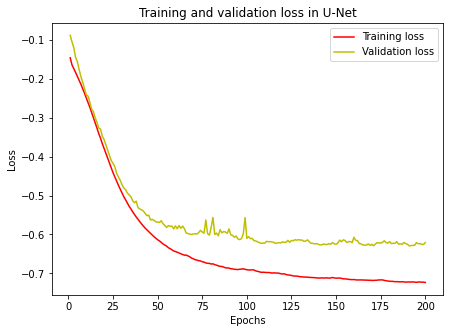

In [32]:
#training-validation loss curve
loss = unet_history.history['loss']
val_loss = unet_history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure(figsize=(7,5))
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'y', label='Validation loss')
plt.title('Training and validation loss in U-Net')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/Unet_loss.png')
plt.show()

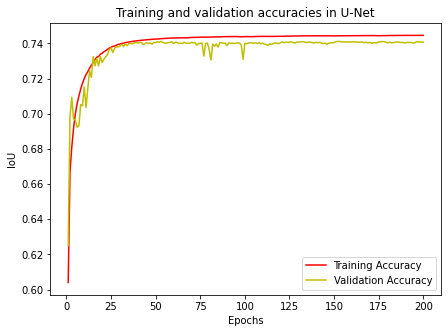

In [33]:
#training-validation accuracy curve
acc = unet_history.history['accuracy']
val_acc = unet_history.history['val_accuracy']
plt.figure(figsize=(7,5))
plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'y', label='Validation Accuracy')
plt.title('Training and validation accuracies in U-Net')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/Unet_accuracies.png')
plt.show()

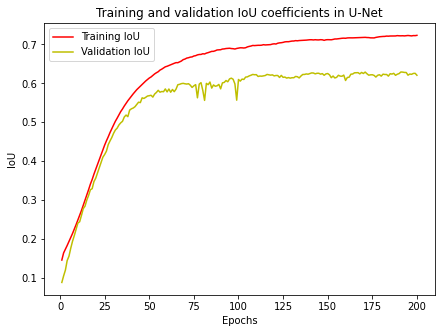

In [34]:
#training-validation IoU curve
iou_coef = unet_history.history['IoU_coef']
val_iou_coef = unet_history.history['val_IoU_coef']
plt.figure(figsize=(7,5))
plt.plot(epochs, iou_coef, 'r', label='Training IoU')
plt.plot(epochs, val_iou_coef, 'y', label='Validation IoU')
plt.title('Training and validation IoU coefficients in U-Net')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/Unet_IoU.png')
plt.show()

In [35]:
#save model
unet_model.save('/content/drive/MyDrive/Datasets/DRIVE/retina_Unet_200epochs.hdf5')

In [36]:
testimg = []
ground_truth = []
unet_prediction = []
unet_global_IoU = []
unet_global_accuracy = []

In [37]:
unet_model.load_weights('/content/drive/MyDrive/Datasets/DRIVE/retina_Unet_200epochs.hdf5') #loading weights

In [38]:
testimages = sorted(os.listdir(path1))
testmasks =  sorted(os.listdir(path2))

In [39]:
for idx, image_name in enumerate(testimages):  
   if image_name.endswith(".jpg"):  
      predicted_patches = []
      test_img = skimage.io.imread(path1+"/"+image_name)
     
      test = test_img[:,:,1] #selecting green channel
      test = clahe_equalized(test) #applying CLAHE
      SIZE_X = (test_img.shape[1]//patch_size)*patch_size #getting size multiple of patch size
      SIZE_Y = (test_img.shape[0]//patch_size)*patch_size #getting size multiple of patch size
      test = cv2.resize(test, (SIZE_X, SIZE_Y))
      testimg.append(test)           
      test = np.array(test)

      patches = patchify(test, (patch_size, patch_size), step=patch_size) #create patches(patch_sizexpatch_sizex1)

      for i in range(patches.shape[0]):
                for j in range(patches.shape[1]):
                  single_patch = patches[i,j,:,:]
                  single_patch_norm = (single_patch.astype('float32')) / 255.
                  single_patch_norm = np.expand_dims(np.array(single_patch_norm), axis=-1)
                  single_patch_input = np.expand_dims(single_patch_norm, 0)
                  single_patch_prediction = (unet_model.predict(single_patch_input)[0,:,:,0] > 0.5).astype(np.uint8) #predict on single patch
                  predicted_patches.append(single_patch_prediction)
      predicted_patches = np.array(predicted_patches)
      predicted_patches_reshaped = np.reshape(predicted_patches, (patches.shape[0], patches.shape[1], patch_size,patch_size) )
      reconstructed_image = unpatchify(predicted_patches_reshaped, test.shape) #join patches to form whole img
      unet_prediction.append(reconstructed_image) 

      groundtruth=[]
      groundtruth = skimage.io.imread(path2+'/'+testmasks[idx]) #reading mask of the test img      
      SIZE_X = (groundtruth.shape[1]//patch_size)*patch_size 
      SIZE_Y = (groundtruth.shape[0]//patch_size)*patch_size  
      groundtruth = cv2.resize(groundtruth, (SIZE_X, SIZE_Y))  
      ground_truth.append(groundtruth)

      y_true = groundtruth
      y_pred = reconstructed_image
      labels = [0, 1]
      IoU = []
      for label in labels:
          jaccard = jaccard_score(y_pred.flatten(),y_true.flatten(), pos_label=label, average='weighted')
          IoU.append(jaccard)
      IoU = np.mean(IoU) #jacard/IoU of single image
      unet_global_IoU.append(IoU)

      cm=[]
      accuracy = []
      cm = confusion_matrix(y_true.flatten(),y_pred.flatten(), labels=[0, 1])
      accuracy = (cm[0,0]+cm[1,1])/(cm[0,0]+cm[0,1]+cm[1,0]+cm[1,1]) #accuracy of single image
      unet_global_accuracy.append(accuracy)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify 

In [40]:
unet_avg_acc =  np.mean(unet_global_accuracy)
unet_mean_IoU = np.mean(unet_global_IoU)

print('Average accuracy is',unet_avg_acc)
print('mean IoU is',unet_mean_IoU)

Average accuracy is 0.9142129603730318
mean IoU is 0.7228289958980401


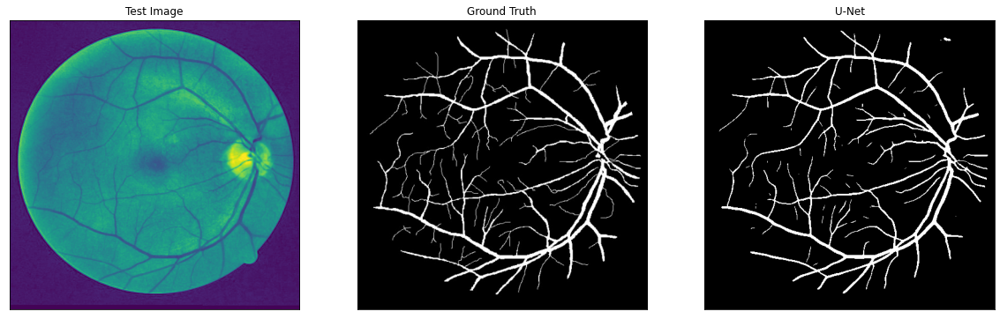

In [41]:
#prediction
#import random
#test_img_number = random.randint(0, len(testimg))
plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Test Image')
plt.xticks([])
plt.yticks([])
plt.imshow(testimg[50])
plt.subplot(132)
plt.title('Ground Truth')
plt.xticks([])
plt.yticks([])
plt.imshow(ground_truth[50],cmap='gray')
plt.subplot(133)
plt.title('U-Net')
plt.xticks([])
plt.yticks([])
plt.imshow(unet_prediction[50],cmap='gray')
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/Unet_predicted.png')
plt.show()


Execution time:  0:00:00.075116


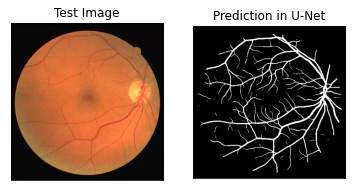

In [42]:
#prediction from single test image
from datetime import datetime 
reconstructed_image = []
test_img = skimage.io.imread('/content/drive/MyDrive/Datasets/DRIVE/test/images/16_test.jpg') #test image

predicted_patches = []
start = datetime.now()   

test = test_img[:,:,1] #selecting green channel
test = clahe_equalized(test) #applying CLAHE
SIZE_X = (test_img.shape[1]//patch_size)*patch_size #getting size multiple of patch size
SIZE_Y = (test_img.shape[0]//patch_size)*patch_size #getting size multiple of patch size
test = cv2.resize(test, (SIZE_X, SIZE_Y))        
test = np.array(test)
patches = patchify(test, (patch_size, patch_size), step=patch_size) #create patches(patch_sizexpatch_sizex1)

for i in range(patches.shape[0]):
    for j in range(patches.shape[1]):
        single_patch = patches[i,j,:,:]
        single_patch_norm = (single_patch.astype('float32')) / 255.
        single_patch_norm = np.expand_dims(np.array(single_patch_norm), axis=-1)
        single_patch_input = np.expand_dims(single_patch_norm, 0)
        single_patch_prediction = (unet_model.predict(single_patch_input)[0,:,:,0] > 0.5).astype(np.uint8) #predict on single patch
    predicted_patches.append(single_patch_prediction)
predicted_patches = np.array(predicted_patches)
predicted_patches_reshaped = np.reshape(predicted_patches, (patches.shape[0], patches.shape[1], patch_size,patch_size) )
unet_reconstructed_image = unpatchify(predicted_patches_reshaped, test.shape) #join patches to form whole img

stop = datetime.now()
print('Execution time: ',(stop-start)) #computation time

plt.subplot(121)
plt.title('Test Image')
plt.xticks([])
plt.yticks([])
plt.imshow(test_img)
plt.subplot(122)
plt.title('Prediction in U-Net')
plt.xticks([])
plt.yticks([])
plt.imshow(unet_reconstructed_image,cmap='gray')
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/Unet_single.png')
plt.show()

# **Residual U-Net**

In [43]:
resUnet_model = residualunet(input_shape)
resUnet_model.compile(optimizer = Adam(lr = 1e-3), loss= IoU_loss, metrics= ['accuracy', IoU_coef])

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_19 (Conv2D)             (None, 512, 512, 16  160         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_19 (BatchN  (None, 512, 512, 16  64         ['conv2d_19[0][0]']              
 ormalization)                  )                                                           

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


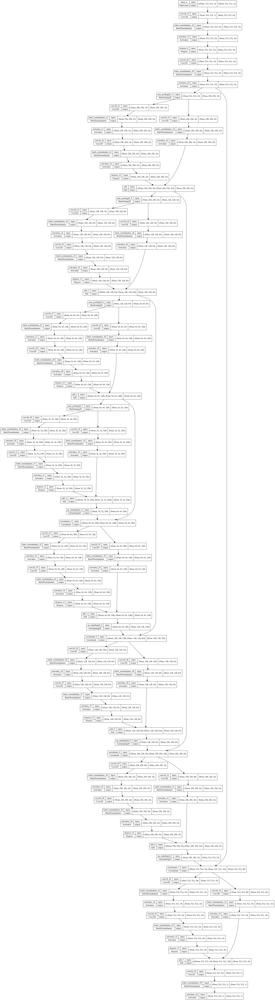

In [44]:
tf.keras.utils.plot_model(resUnet_model, to_file='/content/drive/MyDrive/Datasets/DRIVE/resUnet_model.png', show_shapes=True)

In [45]:
#train model
resUnet_history = resUnet_model.fit(x_train, y_train, 
                    verbose=1,
                    batch_size = 1,
                    validation_data=(x_test, y_test ), 
                    shuffle=False,
                    epochs=200)

Epoch 1/200
64/64 [==============================] - 10s 94ms/step - loss: -0.1496 - accuracy: 0.6234 - IoU_coef: 0.1496 - val_loss: -0.0786 - val_accuracy: 0.7213 - val_IoU_coef: 0.0786
Epoch 2/200
64/64 [==============================] - 5s 82ms/step - loss: -0.1655 - accuracy: 0.6722 - IoU_coef: 0.1655 - val_loss: -0.0879 - val_accuracy: 0.7003 - val_IoU_coef: 0.0879
Epoch 3/200
64/64 [==============================] - 5s 83ms/step - loss: -0.1752 - accuracy: 0.6868 - IoU_coef: 0.1752 - val_loss: -0.1023 - val_accuracy: 0.7019 - val_IoU_coef: 0.1023
Epoch 4/200
64/64 [==============================] - 5s 82ms/step - loss: -0.1849 - accuracy: 0.6965 - IoU_coef: 0.1849 - val_loss: -0.1402 - val_accuracy: 0.6993 - val_IoU_coef: 0.1402
Epoch 5/200
64/64 [==============================] - 5s 83ms/step - loss: -0.1949 - accuracy: 0.7036 - IoU_coef: 0.1949 - val_loss: -0.1548 - val_accuracy: 0.7023 - val_IoU_coef: 0.1548
Epoch 6/200
64/64 [==============================] - 5s 84ms/step - l

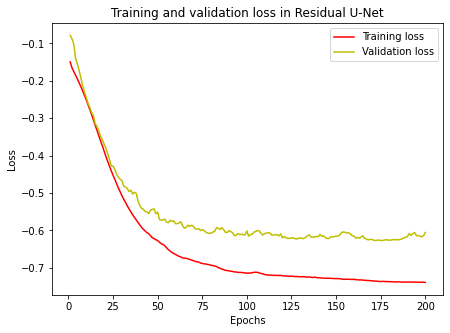

In [46]:
#training-validation loss curve
loss = resUnet_history.history['loss']
val_loss = resUnet_history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure(figsize=(7,5))
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'y', label='Validation loss')
plt.title('Training and validation loss in Residual U-Net')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/resUnet_loss.png')
plt.show()

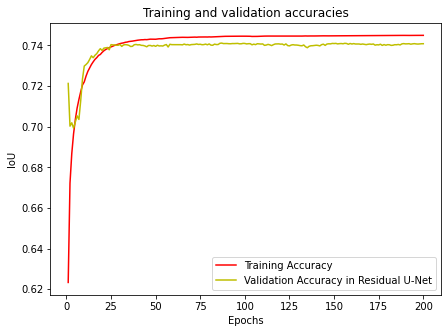

In [47]:
#training-validation accuracy curve
acc = resUnet_history.history['accuracy']
val_acc = resUnet_history.history['val_accuracy']
plt.figure(figsize=(7,5))
plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'y', label='Validation Accuracy in Residual U-Net')
plt.title('Training and validation accuracies')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/resUnet_accuracies.png')
plt.show()

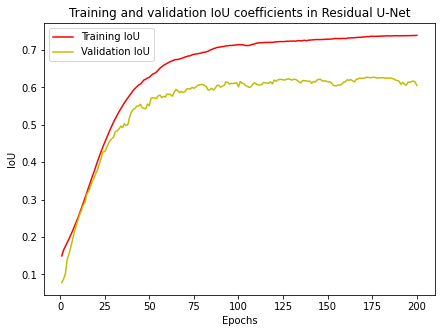

In [48]:
#training-validation IoU curve
iou_coef = resUnet_history.history['IoU_coef']
val_iou_coef = resUnet_history.history['val_IoU_coef']
plt.figure(figsize=(7,5))
plt.plot(epochs, iou_coef, 'r', label='Training IoU')
plt.plot(epochs, val_iou_coef, 'y', label='Validation IoU')
plt.title('Training and validation IoU coefficients in Residual U-Net')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/resUnet_IoU.png')
plt.show()

In [49]:
#save model
resUnet_model.save('/content/drive/MyDrive/Datasets/DRIVE/retina_resUnet_200epochs.hdf5')

In [50]:
testimg = []
ground_truth = []
resUnet_prediction = []
resUnet_global_IoU = []
resUnet_global_accuracy = []

In [51]:
resUnet_model.load_weights('/content/drive/MyDrive/Datasets/DRIVE/retina_resUnet_200epochs.hdf5') #loading weights

In [52]:
testimages = sorted(os.listdir(path1))
testmasks =  sorted(os.listdir(path2))

In [53]:
for idx, image_name in enumerate(testimages):  
    if image_name.endswith(".jpg"):  
        predicted_patches = []
        test_img = skimage.io.imread(path1+"/"+image_name)

        test = test_img[:,:,1] #selecting green channel
        test = clahe_equalized(test) #applying CLAHE
        SIZE_X = (test_img.shape[1]//patch_size)*patch_size #getting size multiple of patch size
        SIZE_Y = (test_img.shape[0]//patch_size)*patch_size #getting size multiple of patch size
        test = cv2.resize(test, (SIZE_X, SIZE_Y))
        testimg.append(test)           
        test = np.array(test)

        patches = patchify(test, (patch_size, patch_size), step=patch_size) #create patches(patch_sizexpatch_sizex1)

    for i in range(patches.shape[0]):
        for j in range(patches.shape[1]):
            single_patch = patches[i,j,:,:]
            single_patch_norm = (single_patch.astype('float32')) / 255.
            single_patch_norm = np.expand_dims(np.array(single_patch_norm), axis=-1)
            single_patch_input = np.expand_dims(single_patch_norm, 0)
            single_patch_prediction = (attnUnet_model.predict(single_patch_input)[0,:,:,0] > 0.5).astype(np.uint8) #predict on single patch
            predicted_patches.append(single_patch_prediction)
        predicted_patches = np.array(predicted_patches)
        predicted_patches_reshaped = np.reshape(predicted_patches, (patches.shape[0], patches.shape[1], patch_size,patch_size) )
        reconstructed_image = unpatchify(predicted_patches_reshaped, test.shape) #join patches to form whole img
        attnUnet_prediction.append(reconstructed_image) 

        groundtruth=[]
        groundtruth = skimage.io.imread(path2+'/'+testmasks[idx]) #reading mask of the test img      
        SIZE_X = (groundtruth.shape[1]//patch_size)*patch_size 
        SIZE_Y = (groundtruth.shape[0]//patch_size)*patch_size  
        groundtruth = cv2.resize(groundtruth, (SIZE_X, SIZE_Y))  
        ground_truth.append(groundtruth)

        y_true = groundtruth
        y_pred = reconstructed_image
        labels = [0, 1]
        IoU = []
        for label in labels:
            jaccard = jaccard_score(y_pred.flatten(),y_true.flatten(), pos_label=label, average='weighted')
            IoU.append(jaccard)
        IoU = np.mean(IoU) #jacard/IoU of single image
        attnUnet_global_IoU.append(IoU)

        cm=[]
        accuracy = []
        cm = confusion_matrix(y_true.flatten(),y_pred.flatten(), labels=[0, 1])
        accuracy = (cm[0,0]+cm[1,1])/(cm[0,0]+cm[0,1]+cm[1,0]+cm[1,1]) #accuracy of single image
        resUnet_global_accuracy.append(accuracy)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify 

In [54]:
resUnet_avg_acc =  np.mean(resUnet_global_accuracy)
resUnet_mean_IoU = np.mean(resUnet_global_IoU)

print('Average accuracy is',resUnet_avg_acc)
print('mean IoU is',resUnet_mean_IoU)

Average accuracy is 0.9143192915619789
mean IoU is 0.7230201405816974


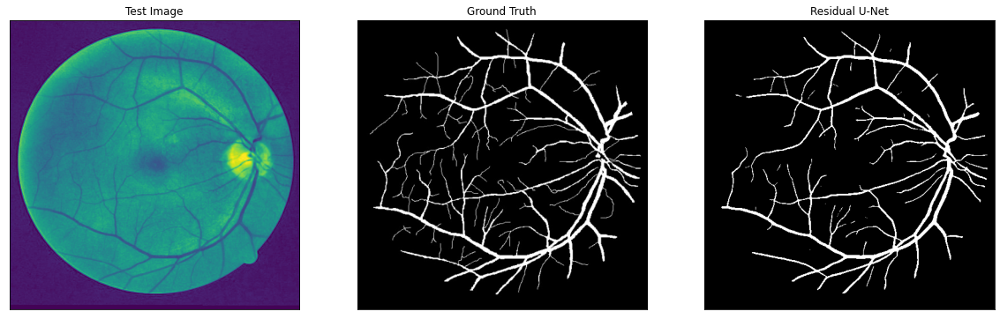

In [55]:
#prediction
#import random
#test_img_number = random.randint(0, len(testimg))
plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Test Image')
plt.xticks([])
plt.yticks([])
plt.imshow(testimg[50])
plt.subplot(132)
plt.title('Ground Truth')
plt.xticks([])
plt.yticks([])
plt.imshow(ground_truth[50],cmap='gray')
plt.subplot(133)
plt.title('Residual U-Net')
plt.xticks([])
plt.yticks([])
plt.imshow(resUnet_prediction[50],cmap='gray')
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/resUnet_predicted.png')
plt.show()

Execution time:  0:00:00.068294


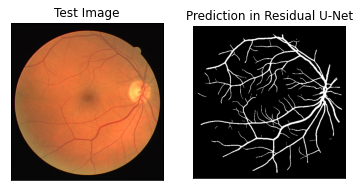

In [56]:
#prediction on single image
from datetime import datetime 
reconstructed_image = []
test_img = skimage.io.imread('/content/drive/MyDrive/Datasets/DRIVE/test/images/16_test.jpg') #test image

predicted_patches = []
start = datetime.now()   

test = test_img[:,:,1] #selecting green channel
test = clahe_equalized(test) #applying CLAHE
SIZE_X = (test_img.shape[1]//patch_size)*patch_size #getting size multiple of patch size
SIZE_Y = (test_img.shape[0]//patch_size)*patch_size #getting size multiple of patch size
test = cv2.resize(test, (SIZE_X, SIZE_Y))        
test = np.array(test)
patches = patchify(test, (patch_size, patch_size), step=patch_size) #create patches(patch_sizexpatch_sizex1)

for i in range(patches.shape[0]):
    for j in range(patches.shape[1]):
        single_patch = patches[i,j,:,:]
        single_patch_norm = (single_patch.astype('float32')) / 255.
        single_patch_norm = np.expand_dims(np.array(single_patch_norm), axis=-1)
        single_patch_input = np.expand_dims(single_patch_norm, 0)
        single_patch_prediction = (resUnet_model.predict(single_patch_input)[0,:,:,0] > 0.5).astype(np.uint8) #predict on single patch
        predicted_patches.append(single_patch_prediction)
predicted_patches = np.array(predicted_patches)
predicted_patches_reshaped = np.reshape(predicted_patches, (patches.shape[0], patches.shape[1], patch_size,patch_size) )
resUnet_reconstructed_image = unpatchify(predicted_patches_reshaped, test.shape) #join patches to form whole img

stop = datetime.now()
print('Execution time: ',(stop-start)) #computation time

plt.subplot(121)
plt.title('Test Image')
plt.xticks([])
plt.yticks([])
plt.imshow(test_img)
plt.subplot(122)
plt.title('Prediction in Residual U-Net')
plt.xticks([])
plt.yticks([])
plt.imshow(resUnet_reconstructed_image,cmap='gray')
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/resUnet_single.png')
plt.show()

# **Attention U-Net**

In [57]:
attnUnet_model = attentionunet(input_shape)
attnUnet_model.compile(optimizer = Adam(lr = 1e-3), loss= IoU_loss, metrics= ['accuracy', IoU_coef])

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_46 (Conv2D)             (None, 512, 512, 16  160         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_46 (BatchN  (None, 512, 512, 16  64         ['conv2d_46[0][0]']              
 ormalization)                  )                                                           

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


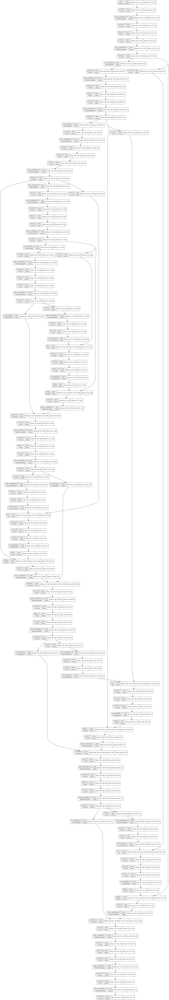

In [58]:
tf.keras.utils.plot_model(attnUnet_model, to_file='/content/drive/MyDrive/Datasets/DRIVE/attnUnet_model.png', show_shapes=True)

In [59]:
#train model
attnUnet_history = attnUnet_model.fit(x_train, y_train, 
                    verbose=1,
                    batch_size = 1,
                    validation_data=(x_test, y_test ), 
                    shuffle=False,
                    epochs=200)

Epoch 1/200
64/64 [==============================] - 11s 97ms/step - loss: -0.1503 - accuracy: 0.6236 - IoU_coef: 0.1503 - val_loss: -0.1049 - val_accuracy: 0.2158 - val_IoU_coef: 0.1049
Epoch 2/200
64/64 [==============================] - 6s 86ms/step - loss: -0.1657 - accuracy: 0.6692 - IoU_coef: 0.1657 - val_loss: -0.0993 - val_accuracy: 0.5236 - val_IoU_coef: 0.0993
Epoch 3/200
64/64 [==============================] - 6s 86ms/step - loss: -0.1752 - accuracy: 0.6833 - IoU_coef: 0.1752 - val_loss: -0.1188 - val_accuracy: 0.7095 - val_IoU_coef: 0.1188
Epoch 4/200
64/64 [==============================] - 6s 87ms/step - loss: -0.1846 - accuracy: 0.6931 - IoU_coef: 0.1846 - val_loss: -0.1440 - val_accuracy: 0.7093 - val_IoU_coef: 0.1440
Epoch 5/200
64/64 [==============================] - 6s 87ms/step - loss: -0.1945 - accuracy: 0.7013 - IoU_coef: 0.1945 - val_loss: -0.1704 - val_accuracy: 0.7170 - val_IoU_coef: 0.1704
Epoch 6/200
64/64 [==============================] - 6s 88ms/step - l

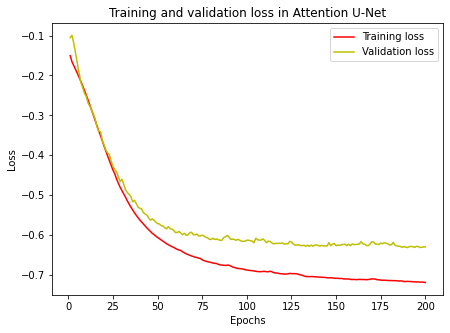

In [60]:
#training-validation loss curve
loss = attnUnet_history.history['loss']
val_loss = attnUnet_history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure(figsize=(7,5))
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'y', label='Validation loss')
plt.title('Training and validation loss in Attention U-Net')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/attnUnet_loss.png')
plt.show()

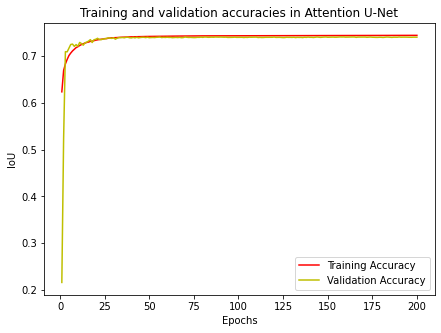

In [61]:
#training-validation accuracy curve
acc = attnUnet_history.history['accuracy']
val_acc = attnUnet_history.history['val_accuracy']
plt.figure(figsize=(7,5))
plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'y', label='Validation Accuracy')
plt.title('Training and validation accuracies in Attention U-Net')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/attnUnet_accuracies.png')
plt.show()

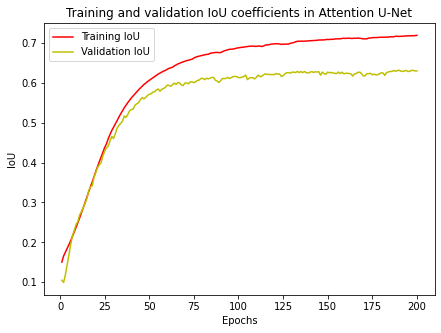

In [62]:
#training-validation IoU curve
iou_coef = attnUnet_history.history['IoU_coef']
val_iou_coef = attnUnet_history.history['val_IoU_coef']
plt.figure(figsize=(7,5))
plt.plot(epochs, iou_coef, 'r', label='Training IoU')
plt.plot(epochs, val_iou_coef, 'y', label='Validation IoU')
plt.title('Training and validation IoU coefficients in Attention U-Net')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/attnUnet_IoU.png')
plt.show()

In [63]:
#save model
attnUnet_model.save('/content/drive/MyDrive/Datasets/DRIVE/retina_attnUnet_200epochs.hdf5')

In [64]:
testimg = []
ground_truth = []
attnUnet_prediction = []
attnUnet_global_IoU = []
attnUnet_global_accuracy = []

In [65]:
attnUnet_model.load_weights('/content/drive/MyDrive/Datasets/DRIVE/retina_attnUnet_200epochs.hdf5') #loading weights

In [66]:
testimages = sorted(os.listdir(path1))
testmasks =  sorted(os.listdir(path2))

In [67]:
for idx, image_name in enumerate(testimages):  
    if image_name.endswith(".jpg"):  
        predicted_patches = []
        test_img = skimage.io.imread(path1+"/"+image_name)

        test = test_img[:,:,1] #selecting green channel
        test = clahe_equalized(test) #applying CLAHE
        SIZE_X = (test_img.shape[1]//patch_size)*patch_size #getting size multiple of patch size
        SIZE_Y = (test_img.shape[0]//patch_size)*patch_size #getting size multiple of patch size
        test = cv2.resize(test, (SIZE_X, SIZE_Y))
        testimg.append(test)           
        test = np.array(test)

        patches = patchify(test, (patch_size, patch_size), step=patch_size) #create patches(patch_sizexpatch_sizex1)

    for i in range(patches.shape[0]):
        for j in range(patches.shape[1]):
            single_patch = patches[i,j,:,:]
            single_patch_norm = (single_patch.astype('float32')) / 255.
            single_patch_norm = np.expand_dims(np.array(single_patch_norm), axis=-1)
            single_patch_input = np.expand_dims(single_patch_norm, 0)
            single_patch_prediction = (attnUnet_model.predict(single_patch_input)[0,:,:,0] > 0.5).astype(np.uint8) #predict on single patch
            predicted_patches.append(single_patch_prediction)
        predicted_patches = np.array(predicted_patches)
        predicted_patches_reshaped = np.reshape(predicted_patches, (patches.shape[0], patches.shape[1], patch_size,patch_size) )
        reconstructed_image = unpatchify(predicted_patches_reshaped, test.shape) #join patches to form whole img
        attnUnet_prediction.append(reconstructed_image) 

        groundtruth=[]
        groundtruth = skimage.io.imread(path2+'/'+testmasks[idx]) #reading mask of the test img      
        SIZE_X = (groundtruth.shape[1]//patch_size)*patch_size 
        SIZE_Y = (groundtruth.shape[0]//patch_size)*patch_size  
        groundtruth = cv2.resize(groundtruth, (SIZE_X, SIZE_Y))  
        ground_truth.append(groundtruth)

        y_true = groundtruth
        y_pred = reconstructed_image
        labels = [0, 1]
        IoU = []
        for label in labels:
            jaccard = jaccard_score(y_pred.flatten(),y_true.flatten(), pos_label=label, average='weighted')
            IoU.append(jaccard)
        IoU = np.mean(IoU) #jacard/IoU of single image
        attnUnet_global_IoU.append(IoU)

        cm=[]
        accuracy = []
        cm = confusion_matrix(y_true.flatten(),y_pred.flatten(), labels=[0, 1])
        accuracy = (cm[0,0]+cm[1,1])/(cm[0,0]+cm[0,1]+cm[1,0]+cm[1,1]) #accuracy of single image
        attnUnet_global_accuracy.append(accuracy)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify 

In [68]:
attnUnet_avg_acc =  np.mean(attnUnet_global_accuracy)
attnUnet_mean_IoU = np.mean(attnUnet_global_IoU)

print('Average accuracy is',attnUnet_avg_acc)
print('mean IoU is',attnUnet_mean_IoU)

Average accuracy is 0.9139891409522065
mean IoU is 0.7223117274310192


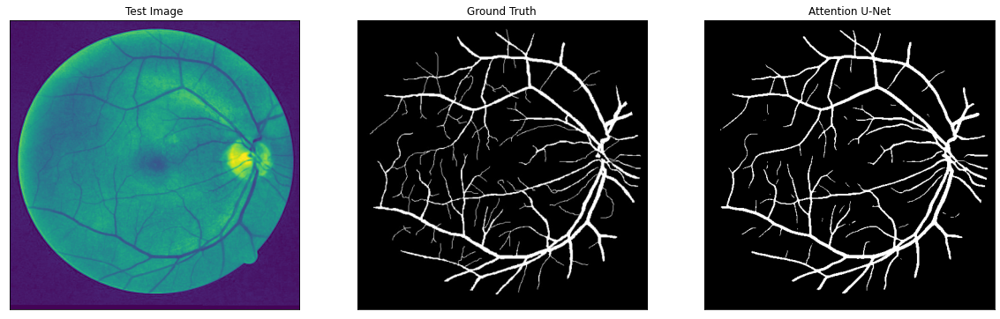

In [69]:
#prediction
#import random
#test_img_number = random.randint(0, len(testimg))
plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Test Image')
plt.xticks([])
plt.yticks([])
plt.imshow(testimg[50])
plt.subplot(132)
plt.title('Ground Truth')
plt.xticks([])
plt.yticks([])
plt.imshow(ground_truth[50],cmap='gray')
plt.subplot(133)
plt.title('Attention U-Net')
plt.xticks([])
plt.yticks([])
plt.imshow(attnUnet_prediction[50],cmap='gray')
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/attnUnet_predicted.png')
plt.show()

Execution time:  0:00:00.086149


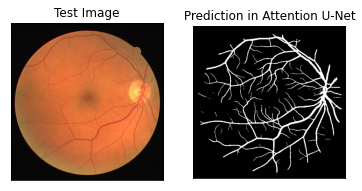

In [70]:
#prediction on single image
from datetime import datetime 
reconstructed_image = []
test_img = skimage.io.imread('/content/drive/MyDrive/Datasets/DRIVE/test/images/16_test.jpg') #test image

predicted_patches = []
start = datetime.now()   

test = test_img[:,:,1] #selecting green channel
test = clahe_equalized(test) #applying CLAHE
SIZE_X = (test_img.shape[1]//patch_size)*patch_size #getting size multiple of patch size
SIZE_Y = (test_img.shape[0]//patch_size)*patch_size #getting size multiple of patch size
test = cv2.resize(test, (SIZE_X, SIZE_Y))        
test = np.array(test)
patches = patchify(test, (patch_size, patch_size), step=patch_size) #create patches(patch_sizexpatch_sizex1)

for i in range(patches.shape[0]):
    for j in range(patches.shape[1]):
        single_patch = patches[i,j,:,:]
        single_patch_norm = (single_patch.astype('float32')) / 255.
        single_patch_norm = np.expand_dims(np.array(single_patch_norm), axis=-1)
        single_patch_input = np.expand_dims(single_patch_norm, 0)
        single_patch_prediction = (attnUnet_model.predict(single_patch_input)[0,:,:,0] > 0.5).astype(np.uint8) #predict on single patch
        predicted_patches.append(single_patch_prediction)
predicted_patches = np.array(predicted_patches)
predicted_patches_reshaped = np.reshape(predicted_patches, (patches.shape[0], patches.shape[1], patch_size,patch_size) )
attnUnet_reconstructed_image = unpatchify(predicted_patches_reshaped, test.shape) #join patches to form whole img

stop = datetime.now()
print('Execution time: ',(stop-start)) #computation time

plt.subplot(121)
plt.title('Test Image')
plt.xticks([])
plt.yticks([])
plt.imshow(test_img)
plt.subplot(122)
plt.title('Prediction in Attention U-Net')
plt.xticks([])
plt.yticks([])
plt.imshow(attnUnet_reconstructed_image,cmap='gray')
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/attnUnet_single.png')
plt.show()

# **Residual-Attention U-Net**

In [71]:
resAttnUnet_model = residual_attentionunet(input_shape)
resAttnUnet_model.compile(optimizer = Adam(lr = 1e-3), loss= IoU_loss, metrics= ['accuracy', IoU_coef])

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_85 (Conv2D)             (None, 512, 512, 16  160         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_73 (BatchN  (None, 512, 512, 16  64         ['conv2d_85[0][0]']              
 ormalization)                  )                                                           

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


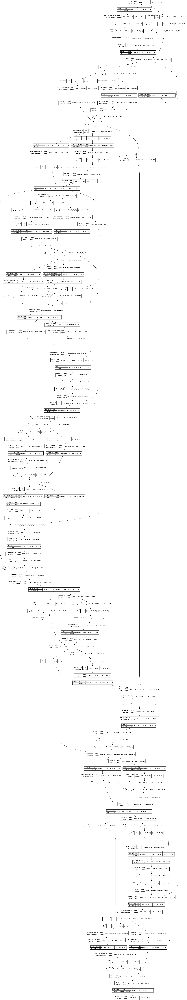

In [72]:
tf.keras.utils.plot_model(resAttnUnet_model, to_file='/content/drive/MyDrive/Datasets/DRIVE/resAttnUnet_model.png', show_shapes=True)

In [73]:
#train model
resAttnUnet_history = resAttnUnet_model.fit(x_train, y_train, 
                    verbose=1,
                    batch_size = 1,
                    validation_data=(x_test, y_test ), 
                    shuffle=False,
                    epochs=200)

Epoch 1/200
64/64 [==============================] - 13s 120ms/step - loss: -0.1512 - accuracy: 0.6235 - IoU_coef: 0.1512 - val_loss: -0.1077 - val_accuracy: 0.6439 - val_IoU_coef: 0.1077
Epoch 2/200
64/64 [==============================] - 7s 111ms/step - loss: -0.1659 - accuracy: 0.6720 - IoU_coef: 0.1659 - val_loss: -0.0912 - val_accuracy: 0.7060 - val_IoU_coef: 0.0912
Epoch 3/200
64/64 [==============================] - 7s 107ms/step - loss: -0.1754 - accuracy: 0.6862 - IoU_coef: 0.1754 - val_loss: -0.1209 - val_accuracy: 0.6821 - val_IoU_coef: 0.1209
Epoch 4/200
64/64 [==============================] - 7s 112ms/step - loss: -0.1853 - accuracy: 0.6971 - IoU_coef: 0.1853 - val_loss: -0.1420 - val_accuracy: 0.7018 - val_IoU_coef: 0.1420
Epoch 5/200
64/64 [==============================] - 7s 109ms/step - loss: -0.1952 - accuracy: 0.7042 - IoU_coef: 0.1952 - val_loss: -0.1566 - val_accuracy: 0.6792 - val_IoU_coef: 0.1566
Epoch 6/200
64/64 [==============================] - 7s 113ms/st

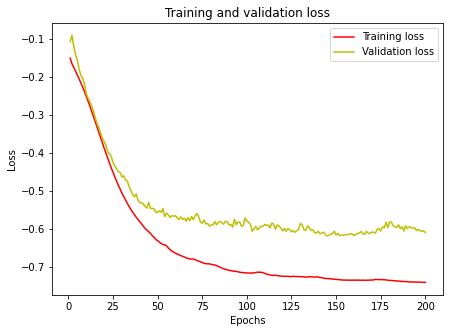

In [74]:
#training-validation loss curve
loss = resAttnUnet_history.history['loss']
val_loss = resAttnUnet_history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure(figsize=(7,5))
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'y', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/resAttnUnet_loss.png')
plt.show()

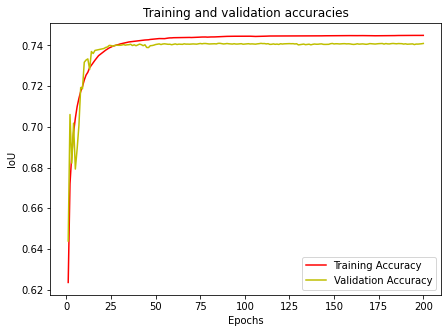

In [75]:
#training-validation accuracy curve
acc = resAttnUnet_history.history['accuracy']
val_acc =resAttnUnet_history.history['val_accuracy']
plt.figure(figsize=(7,5))
plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'y', label='Validation Accuracy')
plt.title('Training and validation accuracies')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/resAttnUnet_accuracies.png')
plt.show()

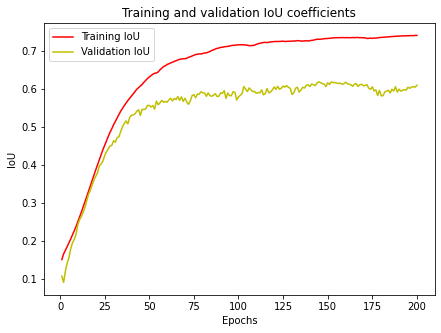

In [78]:
#training-validation IoU curve
iou_coef = resAttnUnet_history.history['IoU_coef']
val_iou_coef = resAttnUnet_history.history['val_IoU_coef']
plt.figure(figsize=(7,5))
plt.plot(epochs, iou_coef, 'r', label='Training IoU')
plt.plot(epochs, val_iou_coef, 'y', label='Validation IoU')
plt.title('Training and validation IoU coefficients')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/resAttnUnet_IoU.png')
plt.show()

In [79]:
#save model
resAttnUnet_model.save('/content/drive/MyDrive/Datasets/DRIVE/retina_resAttnUnet_200epochs.hdf5')

In [80]:
testimg = []
ground_truth = []
resAttnUnet_prediction = []
resAttnUnet_global_IoU = []
resAttnUnet_global_accuracy = []

In [83]:
resAttnUnet_model.load_weights('/content/drive/MyDrive/Datasets/DRIVE/retina_resAttnUnet_200epochs.hdf5') #loading weights

In [84]:
testimages = sorted(os.listdir(path1))
testmasks =  sorted(os.listdir(path2))

In [85]:
for idx, image_name in enumerate(testimages):  
    if image_name.endswith(".jpg"):  
        predicted_patches = []
        test_img = skimage.io.imread(path1+"/"+image_name)

        test = test_img[:,:,1] #selecting green channel
        test = clahe_equalized(test) #applying CLAHE
        SIZE_X = (test_img.shape[1]//patch_size)*patch_size #getting size multiple of patch size
        SIZE_Y = (test_img.shape[0]//patch_size)*patch_size #getting size multiple of patch size
        test = cv2.resize(test, (SIZE_X, SIZE_Y))
        testimg.append(test)           
        test = np.array(test)

        patches = patchify(test, (patch_size, patch_size), step=patch_size) #create patches(patch_sizexpatch_sizex1)

    for i in range(patches.shape[0]):
        for j in range(patches.shape[1]):
            single_patch = patches[i,j,:,:]
            single_patch_norm = (single_patch.astype('float32')) / 255.
            single_patch_norm = np.expand_dims(np.array(single_patch_norm), axis=-1)
            single_patch_input = np.expand_dims(single_patch_norm, 0)
            single_patch_prediction = (attnUnet_model.predict(single_patch_input)[0,:,:,0] > 0.5).astype(np.uint8) #predict on single patch
            predicted_patches.append(single_patch_prediction)
        predicted_patches = np.array(predicted_patches)
        predicted_patches_reshaped = np.reshape(predicted_patches, (patches.shape[0], patches.shape[1], patch_size,patch_size) )
        reconstructed_image = unpatchify(predicted_patches_reshaped, test.shape) #join patches to form whole img
        attnUnet_prediction.append(reconstructed_image) 

        groundtruth=[]
        groundtruth = skimage.io.imread(path2+'/'+testmasks[idx]) #reading mask of the test img      
        SIZE_X = (groundtruth.shape[1]//patch_size)*patch_size 
        SIZE_Y = (groundtruth.shape[0]//patch_size)*patch_size  
        groundtruth = cv2.resize(groundtruth, (SIZE_X, SIZE_Y))  
        ground_truth.append(groundtruth)

        y_true = groundtruth
        y_pred = reconstructed_image
        labels = [0, 1]
        IoU = []
        for label in labels:
            jaccard = jaccard_score(y_pred.flatten(),y_true.flatten(), pos_label=label, average='weighted')
            IoU.append(jaccard)
        IoU = np.mean(IoU) #jacard/IoU of single image
        attnUnet_global_IoU.append(IoU)

        cm=[]
        accuracy = []
        cm = confusion_matrix(y_true.flatten(),y_pred.flatten(), labels=[0, 1])
        accuracy = (cm[0,0]+cm[1,1])/(cm[0,0]+cm[0,1]+cm[1,0]+cm[1,1]) #accuracy of single image
        resAttnUnet_global_accuracy.append(accuracy)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1375: UserWarning: Note that pos_label (set to 0) is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify 

In [86]:
resAttnUnet_avg_acc =  np.mean(resAttnUnet_global_accuracy)
resAttnUnet_mean_IoU = np.mean(resAttnUnet_global_IoU)

print('Average accuracy is',resAttnUnet_avg_acc)
print('mean IoU is',resAttnUnet_mean_IoU)

Average accuracy is 0.9143870029691783
mean IoU is 0.723168795094703


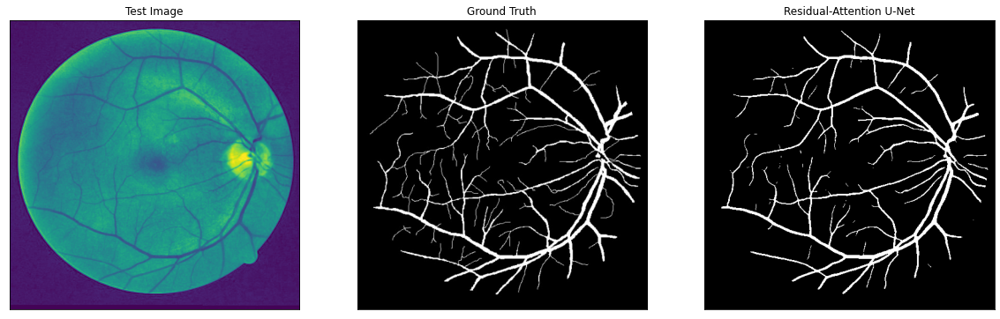

In [87]:
#prediction
#import random
#test_img_number = random.randint(0, len(testimg))
plt.figure(figsize=(20, 10))
plt.subplot(131)
plt.title('Test Image')
plt.xticks([])
plt.yticks([])
plt.imshow(testimg[50])
plt.subplot(132)
plt.title('Ground Truth')
plt.xticks([])
plt.yticks([])
plt.imshow(ground_truth[50],cmap='gray')
plt.subplot(133)
plt.title('Residual-Attention U-Net')
plt.xticks([])
plt.yticks([])
plt.imshow(resAttnUnet_prediction[50],cmap='gray')
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/resAttnUnet_predicted.png')
plt.show()

Execution time:  0:00:00.143533


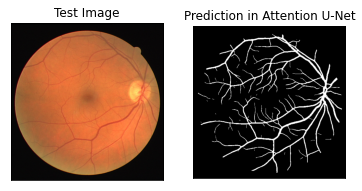

In [89]:
#prediction on single image
from datetime import datetime 
reconstructed_image = []
test_img = skimage.io.imread('/content/drive/MyDrive/Datasets/DRIVE/test/images/16_test.jpg') #test image

predicted_patches = []
start = datetime.now()   

test = test_img[:,:,1] #selecting green channel
test = clahe_equalized(test) #applying CLAHE
SIZE_X = (test_img.shape[1]//patch_size)*patch_size #getting size multiple of patch size
SIZE_Y = (test_img.shape[0]//patch_size)*patch_size #getting size multiple of patch size
test = cv2.resize(test, (SIZE_X, SIZE_Y))        
test = np.array(test)
patches = patchify(test, (patch_size, patch_size), step=patch_size) #create patches(patch_sizexpatch_sizex1)

for i in range(patches.shape[0]):
    for j in range(patches.shape[1]):
        single_patch = patches[i,j,:,:]
        single_patch_norm = (single_patch.astype('float32')) / 255.
        single_patch_norm = np.expand_dims(np.array(single_patch_norm), axis=-1)
        single_patch_input = np.expand_dims(single_patch_norm, 0)
        single_patch_prediction = (resAttnUnet_model.predict(single_patch_input)[0,:,:,0] > 0.5).astype(np.uint8) #predict on single patch
        predicted_patches.append(single_patch_prediction)
predicted_patches = np.array(predicted_patches)
predicted_patches_reshaped = np.reshape(predicted_patches, (patches.shape[0], patches.shape[1], patch_size,patch_size) )
resAttnUnet_reconstructed_image = unpatchify(predicted_patches_reshaped, test.shape) #join patches to form whole img

stop = datetime.now()
print('Execution time: ',(stop-start)) #computation time

plt.subplot(121)
plt.title('Test Image')
plt.xticks([])
plt.yticks([])
plt.imshow(test_img)
plt.subplot(122)
plt.title('Prediction in Attention U-Net')
plt.xticks([])
plt.yticks([])
plt.imshow(resAttnUnet_reconstructed_image,cmap='gray')
plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/resAttnUnet_single.png')
plt.show()

# **Accuracies**

**Models** **Average Accuracy** **Mean IoU**  
  U-Net - 0.914, 0.722      
  Residual U-Net - 0.914, 0.723
  Attention U-Net - 0.914, 0.722
  Residual-Attention U-Net - 0.914, 0.723  

# **Summarizing Results**

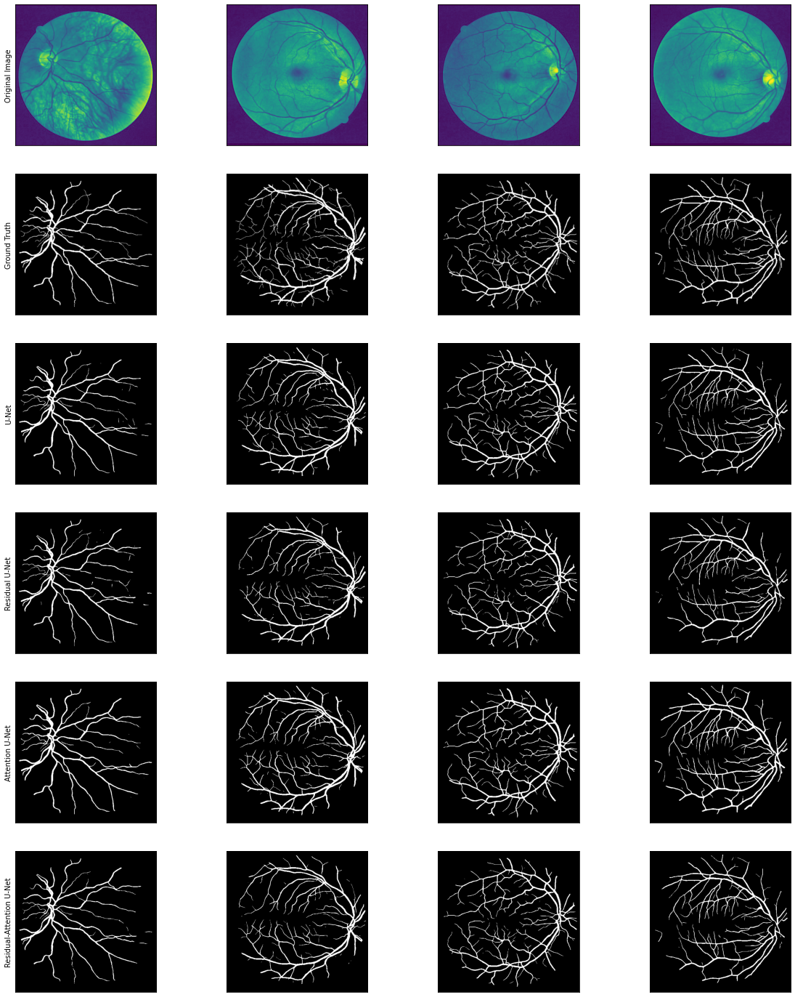

In [95]:
plt.figure(figsize=(20, 25))
plt.subplot(6,4,1)
plt.xticks([])
plt.yticks([])
plt.ylabel('Original Image')
plt.imshow(testimg[9])
plt.subplot(6,4,2)
plt.xticks([])
plt.yticks([])
plt.imshow(testimg[30])
plt.subplot(6,4,3)
plt.xticks([])
plt.yticks([])
plt.imshow(testimg[57])
plt.subplot(6,4,4)
plt.xticks([])
plt.yticks([])
plt.imshow(testimg[70])

plt.subplot(6,4,5)
plt.xticks([])
plt.yticks([])
plt.ylabel('Ground Truth')
plt.imshow(ground_truth[9],cmap='gray')
plt.subplot(6,4,6)
plt.xticks([])
plt.yticks([])
plt.imshow(ground_truth[30],cmap='gray')
plt.subplot(6,4,7)
plt.xticks([])
plt.yticks([])
plt.imshow(ground_truth[57],cmap='gray')
plt.subplot(6,4,8)
plt.xticks([])
plt.yticks([])
plt.imshow(ground_truth[70],cmap='gray')

plt.subplot(6,4,9)
plt.xticks([])
plt.yticks([])
plt.ylabel('U-Net')
plt.imshow(unet_prediction[9],cmap='gray')
plt.subplot(6,4,10)
plt.xticks([])
plt.yticks([])
plt.imshow(unet_prediction[30],cmap='gray')
plt.subplot(6,4,11)
plt.xticks([])
plt.yticks([])
plt.imshow(unet_prediction[57],cmap='gray')
plt.subplot(6,4,12)
plt.xticks([])
plt.yticks([])
plt.imshow(unet_prediction[70],cmap='gray')

plt.subplot(6,4,13)
plt.xticks([])
plt.yticks([])
plt.ylabel('Residual U-Net')
plt.imshow(resUnet_prediction[9],cmap='gray')
plt.subplot(6,4,14)
plt.xticks([])
plt.yticks([])
plt.imshow(resUnet_prediction[30],cmap='gray')
plt.subplot(6,4,15)
plt.xticks([])
plt.yticks([])
plt.imshow(resUnet_prediction[57],cmap='gray')
plt.subplot(6,4,16)
plt.xticks([])
plt.yticks([])
plt.imshow(resUnet_prediction[70],cmap='gray')

plt.subplot(6,4,17)
plt.xticks([])
plt.yticks([])
plt.ylabel('Attention U-Net')
plt.imshow(attnUnet_prediction[9],cmap='gray')
plt.subplot(6,4,18)
plt.xticks([])
plt.yticks([])
plt.imshow(attnUnet_prediction[30],cmap='gray')
plt.subplot(6,4,19)
plt.xticks([])
plt.yticks([])
plt.imshow(attnUnet_prediction[57],cmap='gray')
plt.subplot(6,4,20)
plt.xticks([])
plt.yticks([])
plt.imshow(attnUnet_prediction[70],cmap='gray')

plt.subplot(6,4,21)
plt.xticks([])
plt.yticks([])
plt.ylabel('Residual-Attention U-Net')
plt.imshow(resAttnUnet_prediction[9],cmap='gray')
plt.subplot(6,4,22)
plt.xticks([])
plt.yticks([])
plt.imshow(resAttnUnet_prediction[30],cmap='gray')
plt.subplot(6,4,23)
plt.xticks([])
plt.yticks([])
plt.imshow(resAttnUnet_prediction[57],cmap='gray')
plt.subplot(6,4,24)
plt.xticks([])
plt.yticks([])
plt.imshow(resAttnUnet_prediction[70],cmap='gray')

plt.savefig('/content/drive/MyDrive/Datasets/DRIVE/results.png')
plt.show()